# Разведочный анализ данных

## Проект 35 "Предсказание погоды для города/городов"

**Куратор**: Васильев Николай @nnvasilevkk

**Участники (Команда 54)**:
- Гаврилова Анастасия Витальевна @kadaobed
- Ковырков Денис Андреевич @denis_kovyrkov
- Лысов Игорь Игоревич @lysov1
- Панченко Василий Игоревич @panchenko_vi
- Чуканов Тимофей Вячеславович @Timm27

## Анализ данных
На этом этапе нашей работы, в качестве данных для исследования, мы взяли исторические данные по координатам в районе Белорусского вокзала Москвы, предоставленные `OpenWeatherMap`



In [1]:
import folium
from IPython.display import display

In [18]:
latitude = 55.773239
longitude = 37.580463

f = folium.Figure(width=1200, height=300)
map = folium.Map(location=[latitude, longitude], zoom_start=15)
folium.Marker([latitude, longitude], popup='<b>Рассматриваемая точка</b>').add_to(map)
map.add_to(f)

f

In [2]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.iolib.table import SimpleTable
from sklearn.metrics import r2_score
from datetime import datetime, timedelta

Доступны исторические данные о погоде за период с 00:00 1 января 1979 г. по 23:00 2024-10-18 гг. с шагом в 1 час (всего 401472 наблюдения).

Погодные данные содержат информацию о динамике таких погодных параметров как фактическиая и ощущаемая температура, атмофсферное давление, влажность и прочее. Детальное описание полей можно прочесть тут - https://openweathermap.org/history-bulk#parameter

In [53]:
weather_data = pd.read_csv('Custom_location.csv')
weather_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401472 entries, 0 to 401471
Data columns (total 28 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   dt                   401472 non-null  int64  
 1   dt_iso               401472 non-null  object 
 2   timezone             401472 non-null  int64  
 3   city_name            401472 non-null  object 
 4   lat                  401472 non-null  float64
 5   lon                  401472 non-null  float64
 6   temp                 401472 non-null  float64
 7   visibility           0 non-null       float64
 8   dew_point            401472 non-null  float64
 9   feels_like           401472 non-null  float64
 10  temp_min             401472 non-null  float64
 11  temp_max             401472 non-null  float64
 12  pressure             401472 non-null  int64  
 13  sea_level            0 non-null       float64
 14  grnd_level           0 non-null       float64
 15  humidity         

Из 28 атрибутов исходного датасета атрибуты `dt` (время вычисления данных), `timezone` (Сдвиг в секундах от UTC), `city_name` (локация), `lat` (долгота), `lon` (широта), `weather_icon` являются константами либо не информативны, поэтому далее они не будут анализироваться

Атрибуты `visibility` (видимость), `sea_level` (высота над уровнем моря), `grnd_level` (вовсе не описан в документации) не заполнены. Атрибуты `wind_gust` (порыв ветра), `rain_1h` (объем дождевых осадков в течение часа), `rain_3h`, `snow_1h` (объем снежных осадков в течении часа), `snow_3h` заполнены частично

In [4]:
#weather_data['dt'] = weather_data['dt'].apply(lambda row: datetime.fromtimestamp(int(row)))
#weather_data['dt'] = pd.to_datetime(weather_data['dt'])

print('weather_main = ', weather_data['weather_main'].unique())
print('weather_description =', weather_data['weather_description'].unique())

weather_main =  ['Clouds' 'Snow' 'Clear' 'Rain']
weather_description = ['overcast clouds' 'broken clouds' 'light snow' 'sky is clear'
 'scattered clouds' 'snow' 'few clouds' 'light rain' 'moderate rain'
 'heavy intensity rain']


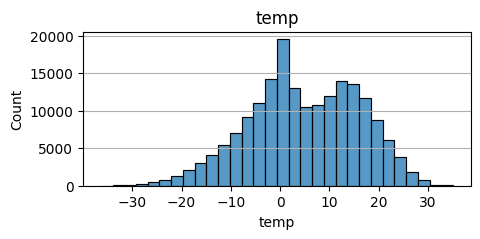

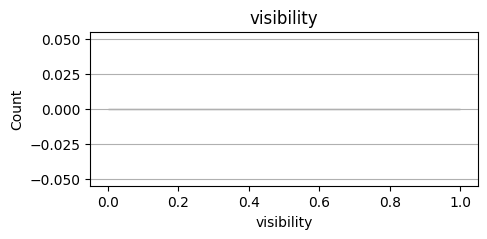

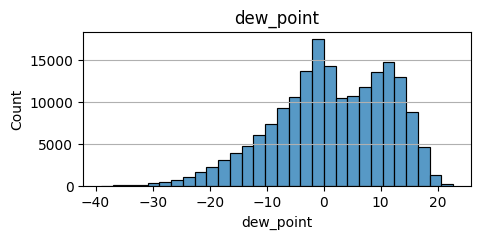

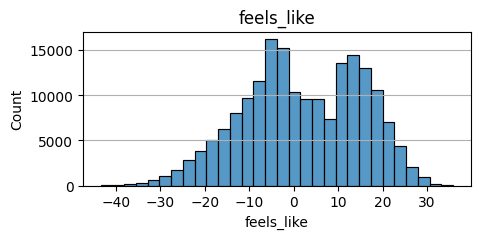

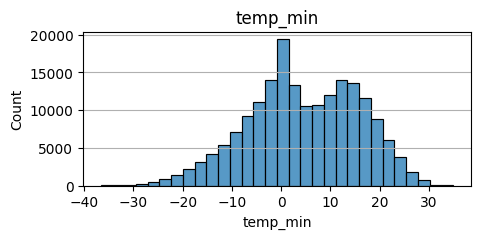

...

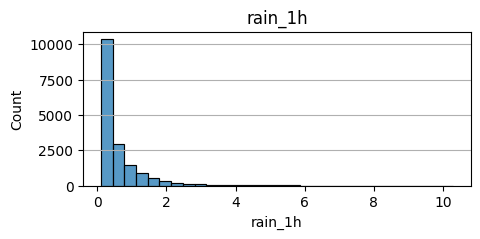

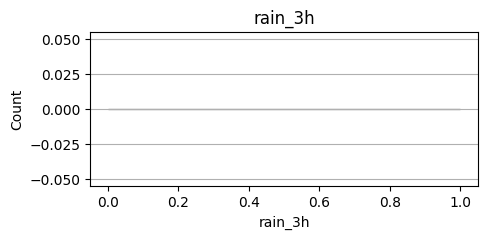

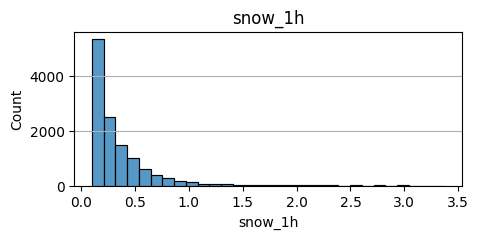

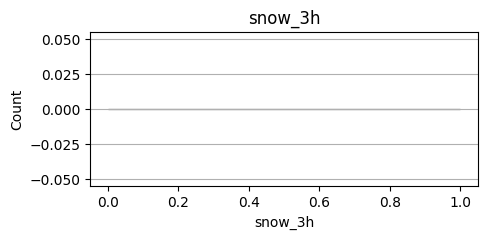

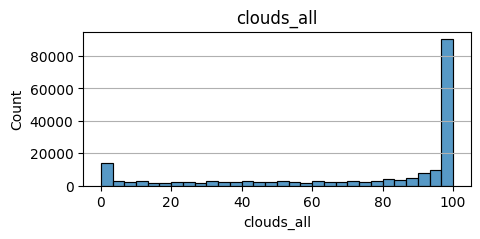

In [12]:
lst_number = list(weather_data.describe(include='number').columns)
for column in lst_number:
    if column not in ['lat', 'lon', 'dt_iso', 'timezone', 'weather_id']:
      plt.figure(figsize=(5, 2))
      sns.histplot(weather_data[column], bins=30)
      plt.title(column)
      plt.xlabel(column)
      plt.ylabel('Count')
      plt.grid(axis='y')
      plt.show()

Пожалуй сразу дропнем пустые столбцы

In [54]:
weather_data = weather_data.drop(
    columns=['sea_level', 'visibility', 'grnd_level', 'wind_gust', 'rain_3h', 'snow_3h']
)

In [55]:
lst_number = list(weather_data.describe(include='number').columns)
weather_data.columns


Index(['dt', 'dt_iso', 'timezone', 'city_name', 'lat', 'lon', 'temp',
       'dew_point', 'feels_like', 'temp_min', 'temp_max', 'pressure',
       'humidity', 'wind_speed', 'wind_deg', 'rain_1h', 'snow_1h',
       'clouds_all', 'weather_id', 'weather_main', 'weather_description',
       'weather_icon'],
      dtype='object')

Показатели температуры в основном в интервале от -10 до +15 градусов, распределения немного скошены вправо. Давление в основном находится в интервале от 1000 до 1030 мм. Распределение влажности имеет скос вправо, в основном наблюдения имеют значения 80-100%. Распределение скорости ветра имеет скос влево, в основном от 1 до 5 м/с. Распределение направления ветра не равномерное, но и не нормальное. Объем осадков (снег/дождь за поледние 1-3 часа) в основном не более 1 мм. Относительно облачности: чаще всего 100% облачность, также чаще всего наблюдалась облачная погода (weather_main: Clouds).

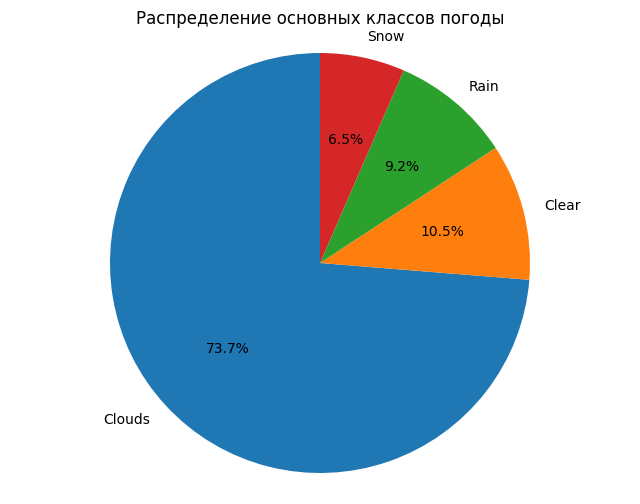

In [13]:
frequency = weather_data['weather_main'].value_counts()

plt.figure(figsize=(8, 6))
plt.pie(frequency, labels=frequency.index, autopct='%1.1f%%', startangle=90)
plt.title('Распределение основных классов погоды')
plt.axis('equal')
plt.show()

Также можно взглянуть на более детальную разбивку классов погоды

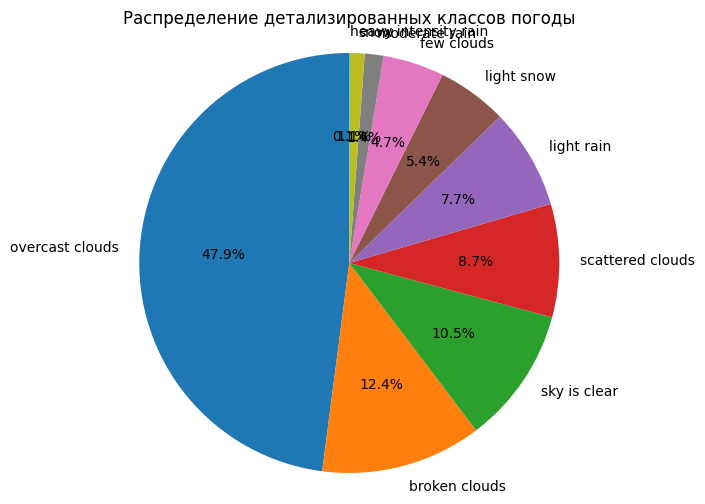

In [14]:
frequency = weather_data['weather_description'].value_counts()

plt.figure(figsize=(8, 6))
plt.pie(frequency, labels=frequency.index, autopct='%1.1f%%', startangle=90)
plt.title('Распределение детализированных классов погоды')
plt.axis('equal')
plt.show()

In [56]:
corrected_cols = [col for col in lst_number if col not in ['timezone', 'lat', 'lon', 'weather_id', 'rain_1h', 'snow_1h']]
corrected_cols

['dt',
 'temp',
 'dew_point',
 'feels_like',
 'temp_min',
 'temp_max',
 'pressure',
 'humidity',
 'wind_speed',
 'wind_deg',
 'clouds_all']

Построим box-чарты основных погодных показателей на выявление выбросов в данных

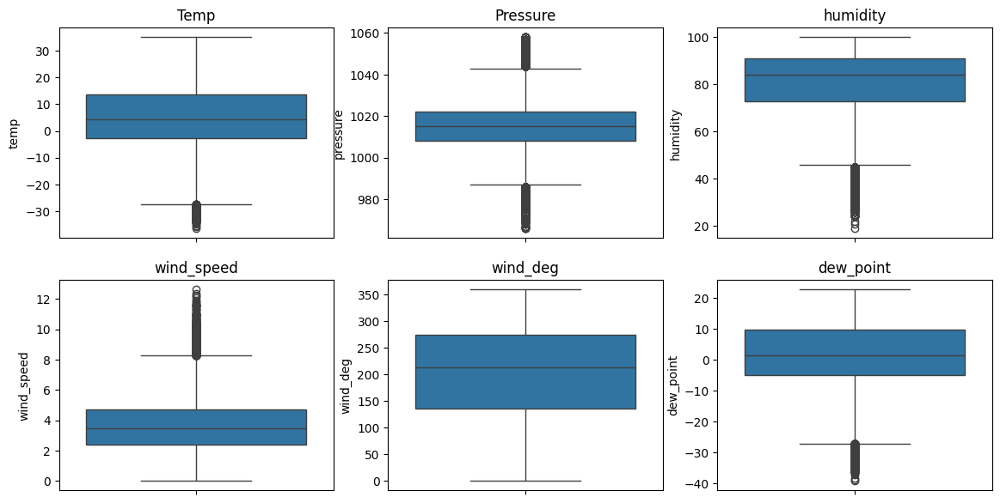

In [27]:
plt.figure(figsize=(14, 7))

plt.subplot(2, 3, 1)
sns.boxplot(y = weather_data.temp)
plt.title("Temp")

plt.subplot(2, 3, 2)
sns.boxplot(y = weather_data.pressure)
plt.title("Pressure")

plt.subplot(2, 3, 3)
sns.boxplot(y = weather_data.humidity)
plt.title("humidity")

plt.subplot(2, 3, 4)
sns.boxplot(y = weather_data.wind_speed)
plt.title("wind_speed")

plt.subplot(2, 3, 5)
sns.boxplot(y = weather_data.wind_deg)
plt.title("wind_deg")

plt.subplot(2, 3, 6)
sns.boxplot(y = weather_data.dew_point)
plt.title("dew_point")

plt.show()

Видно, что в данных есть множество выбросов, очистим их и затем попробуем более деательно на них посмотреть

In [141]:
def find_IQR(data, column):
    q_25, q_75 = np.quantile(data[column], 0.25), np.quantile(data[column], 0.75)
    IQR = q_75 - q_25
    whiskers_range = IQR * 1.5
    lower, upper = q_25 - whiskers_range, whiskers_range + q_75
    return lower, upper

In [30]:
lower, upper = find_IQR(weather_data, "temp")
print(lower, upper)

-27.46 38.38


In [142]:
for column in corrected_cols:
    print(column)
    lower, upper = find_IQR(weather_data, column)
    weather_data = weather_data[(weather_data[column] > lower) & (weather_data[column] < upper)]

dt
temp
dew_point
feels_like
temp_min
temp_max
pressure
humidity
wind_speed
wind_deg
clouds_all


Теперь можем посмотреть на взаимные распределения основных погодных показателей в зависимости друг от друга и корреляции между ними. В частности, интересно взглянуть на распределения в соотвествии с классами погоды

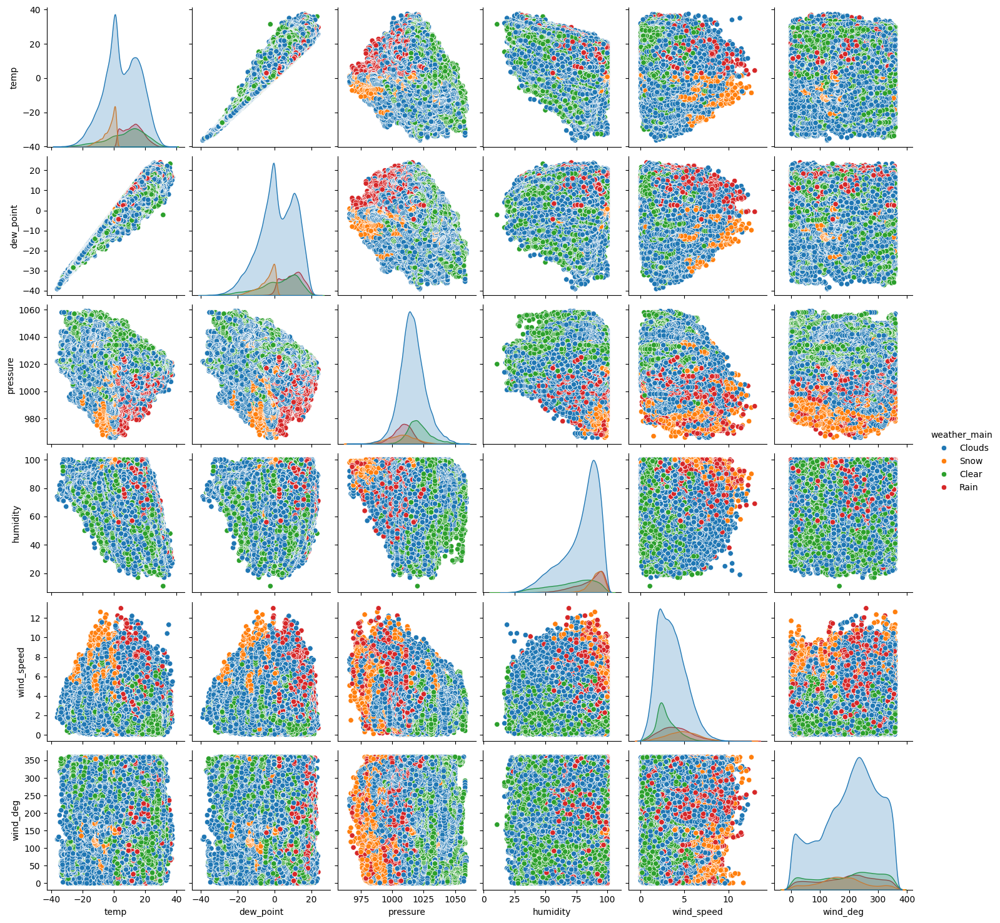

In [8]:
sns.pairplot(weather_data, hue='weather_main', vars=['temp', 'dew_point', 'pressure', 'humidity', 'wind_speed', 'wind_deg'])
plt.show()

По диаграммам рассеяния, построенных для всей выборки, виден в целом линейный характер связи между показателями температуры. Показатели температуры в целом имеют отрицательную связь с показателями давления и влажности. Со скоростью ветра и облачностью, объемом осадков снега и дождя (show_1h, rain_1h), есть слабая положительная связь.

Показатель давления скорее отрицательно связан с влажностью и скоростью ветра.

Для более высокой влажности характерно более частое выпадение осадков в виде дождя и снега.

Для показателей ветра сложно выделить какие-либо связи, кроме связи с давлением и температурой, так как диаграммы рассеяния в основном достаточно бесформенны.

Для показателей осадков можно отметить следующие особенности распределений: ненулевые наблюдения об объеме выпавшего снега есть для показателей температур ниже 0, об объеме дождевых осадков -- для температур выше 0, что естественно. При этом при большей влажности и облачности выпадают более интенсивные осадки. Дожди идут в среднем более интенсивно при меньшей скорости ветра.

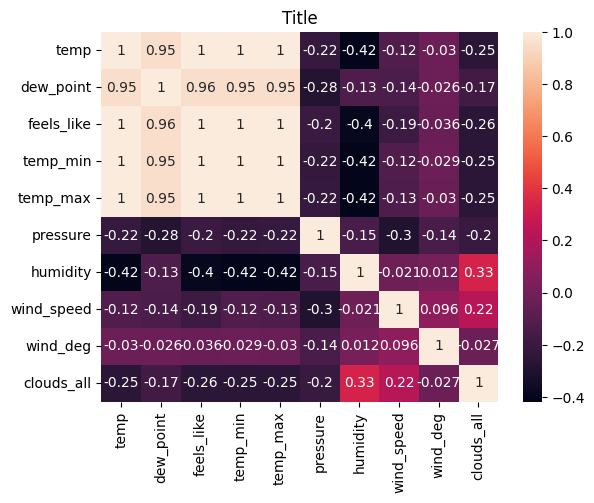

In [13]:
corr = weather_data[corrected_cols].corr()
sns.heatmap(corr, annot=True)
plt.title('Title')
plt.show()

Посмотрим на корреляционные матрицы для каждого из классов погоды

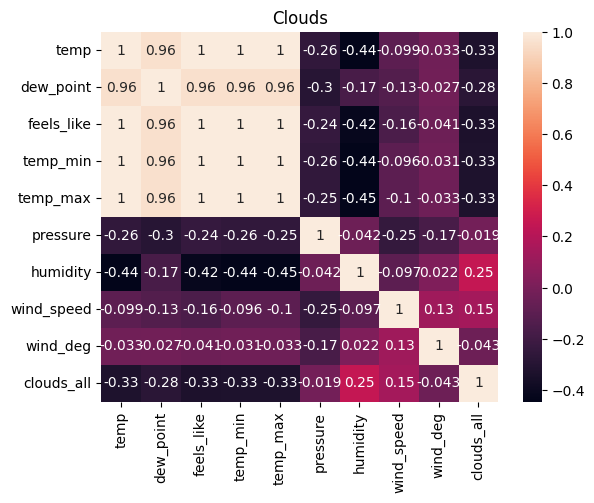

In [14]:
corr = weather_data[weather_data['weather_main'] == 'Clouds'][corrected_cols].corr()
sns.heatmap(corr, annot=True)
plt.title('Clouds')
plt.show()

Для погоды типа Clouds в целом получены аналогичные результаты ввиду того, что этот тип погоды является преобладающим.

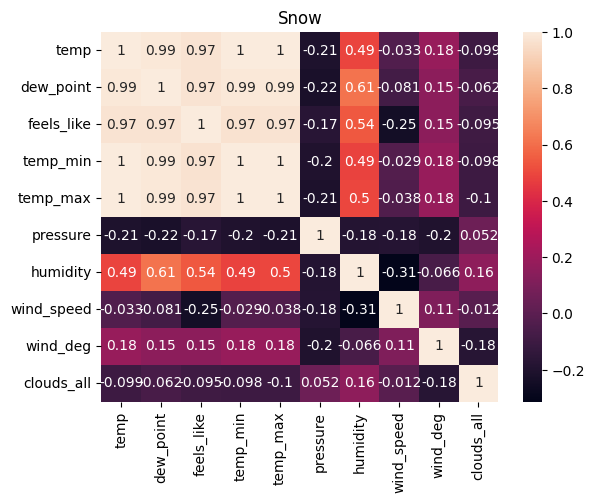

In [15]:
corr = weather_data[weather_data['weather_main'] == 'Snow'][corrected_cols].corr()
sns.heatmap(corr, annot=True)
plt.title('Snow')
plt.show()

В случае снежной погоды есть более ярко выраженная связь между влажностью и показателями температуры, которая всегда ниже 0 для данного типа погоды: чем ближе к 0, тем больше влажность. При этом давление скорее отрицательно связано с показателями температуры.
Выпадение снега и облачность сильнее при температурах, более близких к 0. Выпадение снега также скорее положительно связано с влажностью.

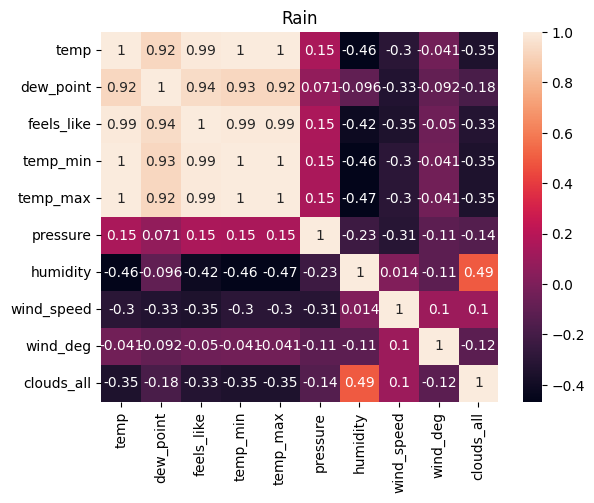

In [16]:
corr = weather_data[weather_data['weather_main'] == 'Rain'][corrected_cols].corr()
sns.heatmap(corr, annot=True)
plt.title('Rain')
plt.show()

В случае дождливой погоды выводы в целом аналогичны.

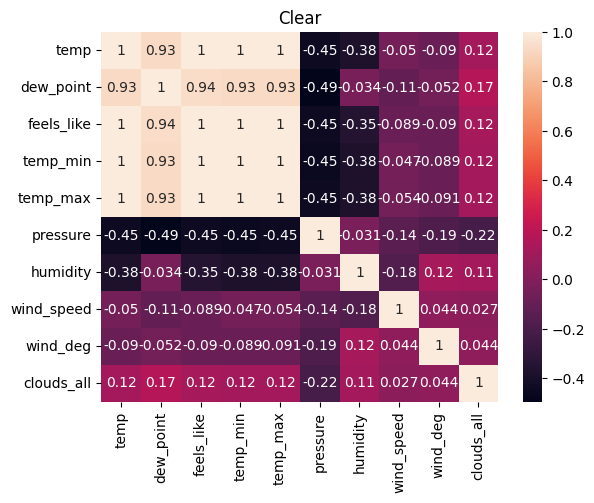

In [17]:
corr = weather_data[weather_data['weather_main'] == 'Clear'][corrected_cols].corr()
sns.heatmap(corr, annot=True)
plt.title('Clear')
plt.show()

В случае ясной погоды выводы относительно связи между показателями температуры, влажности и давления сохраняются. Об осадках выводы сделать логично нельзя, поскольу осадков нет

Дополнительно можно изобразить несколько hex-plot'ов о зависимостях между переменными

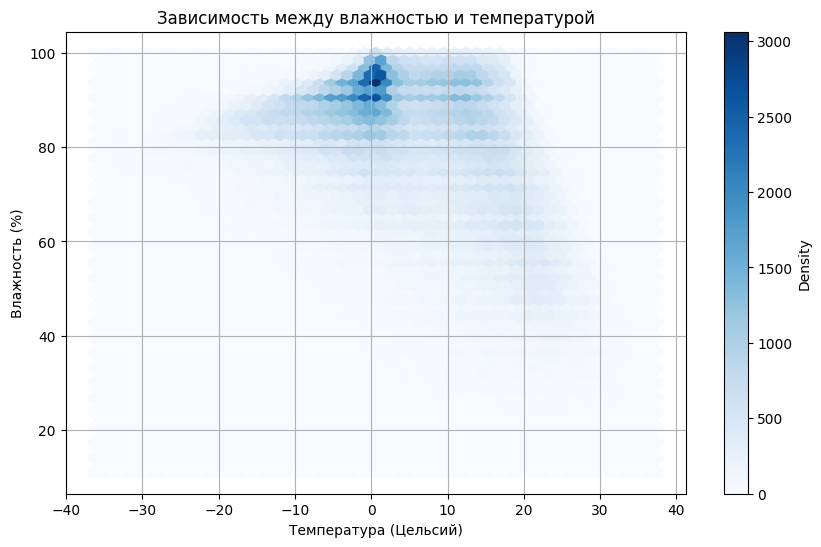

In [19]:
plt.figure(figsize=(10, 6))
plt.hexbin(weather_data['temp'], weather_data['humidity'], gridsize=50, cmap='Blues')

plt.title('Зависимость между влажностью и температурой')
plt.xlabel('Температура (Цельсий)')
plt.ylabel('Влажность (%)')

plt.colorbar(label='Density')

plt.grid(True)
plt.show()

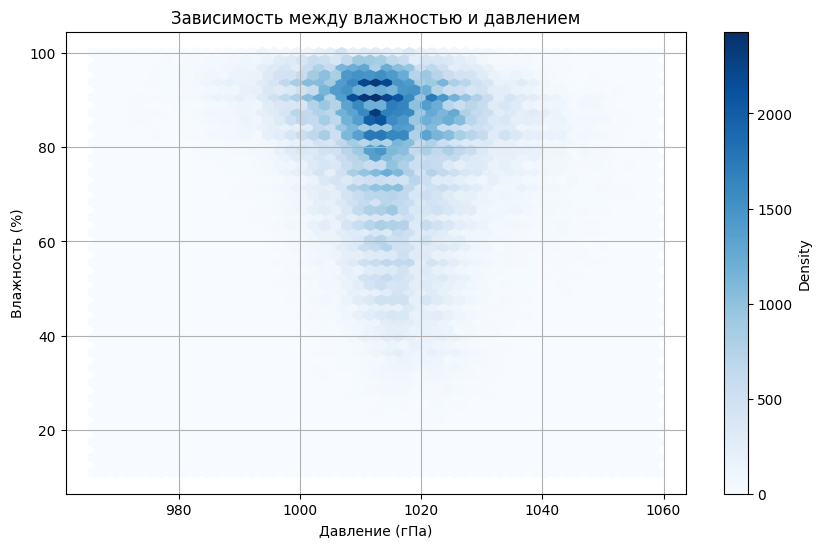

In [22]:
plt.figure(figsize=(10, 6))
plt.hexbin(weather_data['pressure'], weather_data['humidity'], gridsize=50, cmap='Blues')

plt.title('Зависимость между влажностью и давлением')
plt.xlabel('Давление (гПа)')
plt.ylabel('Влажность (%)')

plt.colorbar(label='Density')

plt.grid(True)
plt.show()

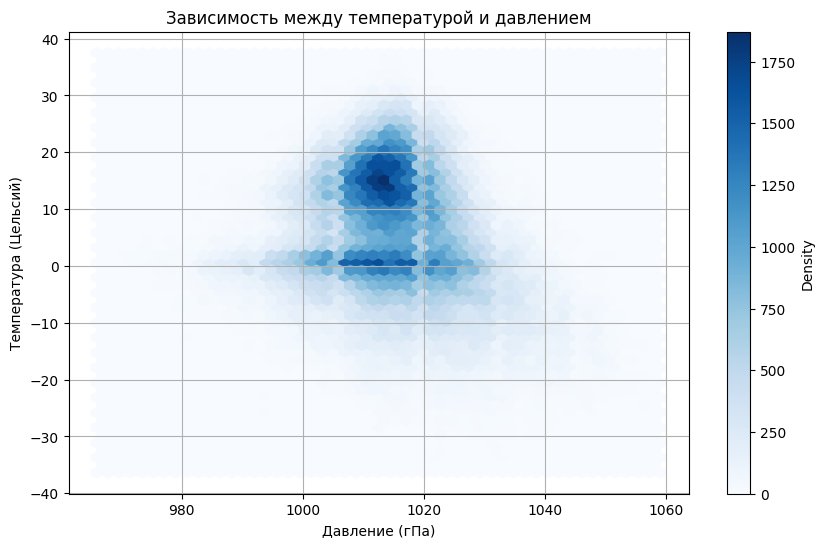

In [23]:
plt.figure(figsize=(10, 6))
plt.hexbin(weather_data['pressure'], weather_data['temp'], gridsize=50, cmap='Blues')

plt.title('Зависимость между температурой и давлением')
plt.xlabel('Давление (гПа)')
plt.ylabel('Температура (Цельсий)')

plt.colorbar(label='Density')

plt.grid(True)
plt.show()

Есть сильно выраженный кластер давления около 0 градусов по Цельсию и вокруг 15 градусов, а также почти все данные о влажность находятся в диапазлоне 80-100% c наиболее частыми и большими значениями в районе 0 градусов по Цельсию

Теперь рассмотрим наши данные в динамике

In [143]:
weather_data2 = weather_data.copy()
weather_data2['dt'] = pd.to_datetime(weather_data2['dt'], unit='s')

In [144]:
weather_data2['mm'] = weather_data2['dt'].dt.month

In [145]:
lst_number = list(weather_data2.describe(include='number').columns)
lst_number = [col for col in lst_number if col not in ['timezone', 'lat', 'lon', 'weather_id', 'mm']]
lst_number

['temp',
 'dew_point',
 'feels_like',
 'temp_min',
 'temp_max',
 'pressure',
 'humidity',
 'wind_speed',
 'wind_deg',
 'rain_1h',
 'snow_1h',
 'clouds_all']

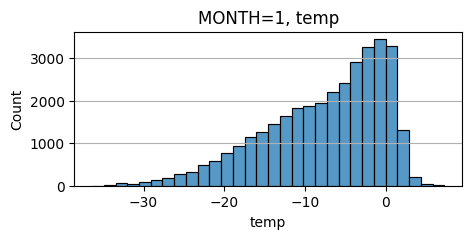

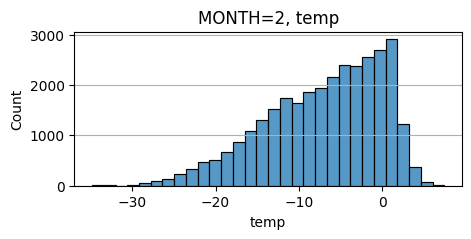

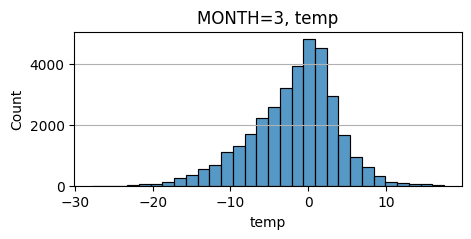

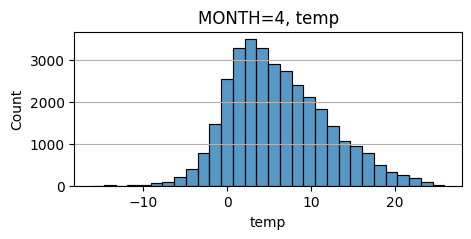

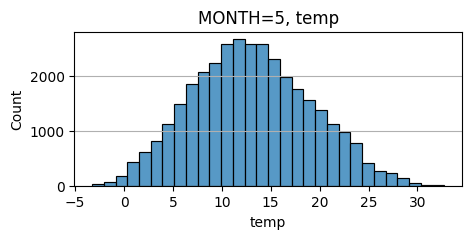

...

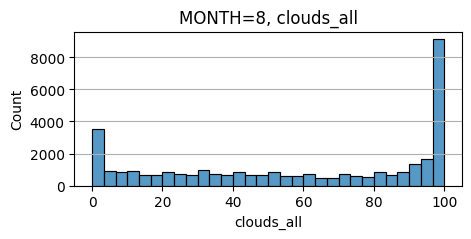

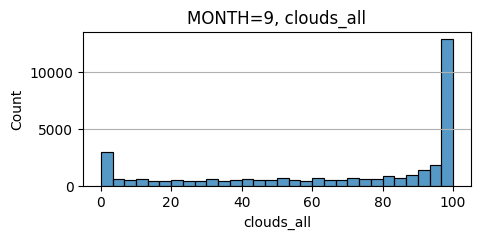

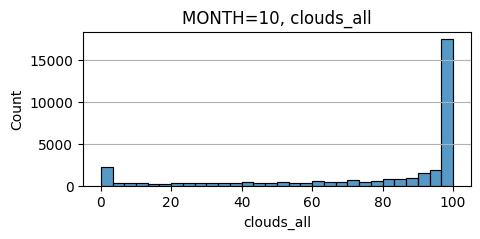

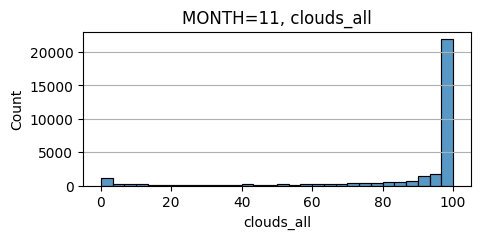

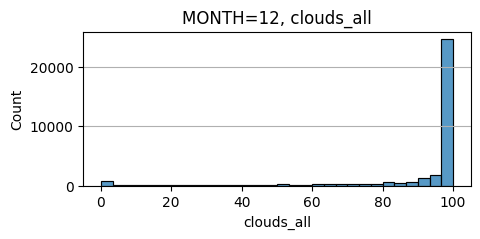

In [64]:
months = list(weather_data2['mm'].unique())
for column in lst_number:
    for m in months:
        plt.figure(figsize=(5, 2))
        sns.histplot(weather_data2[weather_data2['mm'] == m][column], bins=30)
        plt.title(f"MONTH={m}, {column}")
        plt.xlabel(column)
        plt.ylabel('Count')
        plt.grid(axis='y')
        plt.show()

In [65]:
def get_season(row):
    if row < 4:
        return 1
    elif row < 7:
        return 2
    elif row < 10:
        return 3
    elif row < 13:
        return 4

weather_data2['season'] = weather_data2['mm'].apply(get_season)

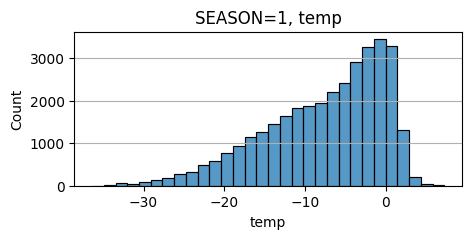

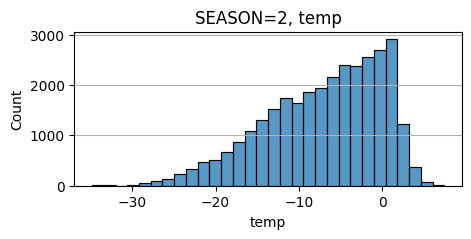

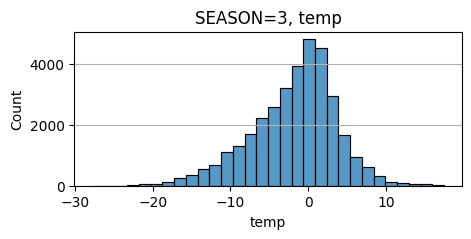

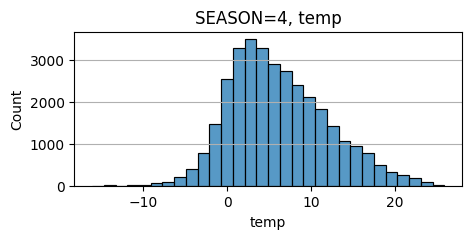

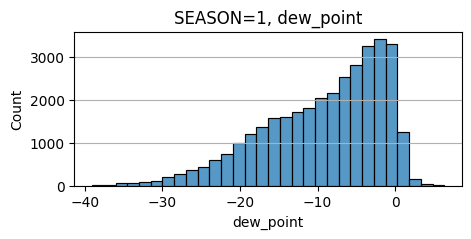

...

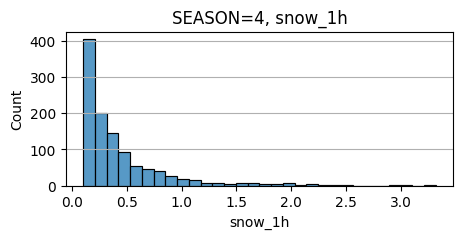

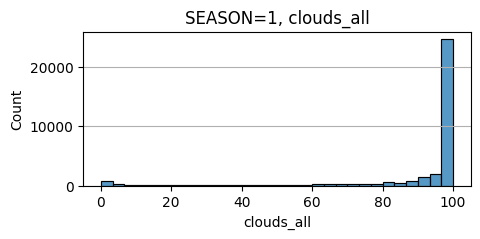

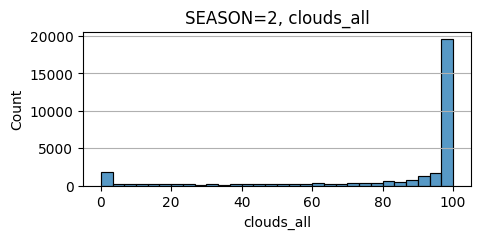

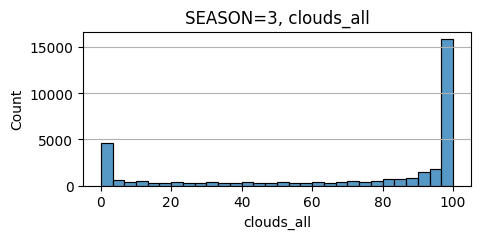

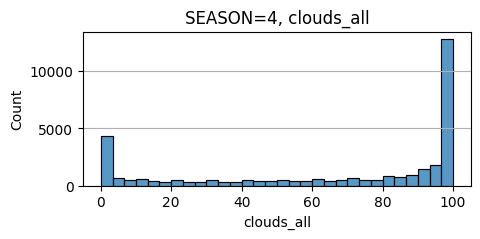

In [66]:
seasons = list(weather_data2['season'].unique())
for column in lst_number:
    for s in seasons:
        plt.figure(figsize=(5, 2))
        sns.histplot(weather_data2[weather_data2['mm'] == s][column], bins=30)
        plt.title(f"SEASON={s}, {column}")
        plt.xlabel(column)
        plt.ylabel('Count')
        plt.grid(axis='y')
        plt.show()

Большая часть распределений сдвигается вправо в течение года, что в целом логично, а у влажности спадает перепад в распределении и оно принимает более равномерную форму


In [126]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
pd.options.plotting.backend = "plotly"
from statsmodels.tsa.stattools import adfuller


In [146]:
weather_data2['date'] = weather_data2['dt'].dt.date
weather_data2['year'] = weather_data2['dt'].dt.year

In [78]:
def get_season(row):
    if row == 12 or row < 3:
        return 'Зима'
    elif row < 6:
        return 'Весна'
    elif row < 9:
        return 'Лето'
    elif row < 12:
        return 'Осень'

weather_data2['season'] = weather_data2['mm'].apply(get_season)

In [82]:
df_season_year = weather_data2.copy()
df_season_year = df_season_year[df_season_year['dt'] < '2024-01-01']
df_season_year = df_season_year.groupby(['season', 'year'], as_index=False).agg(
    #temp_mean=('temp','mean'),
    temp_median=('temp','median'),
    #feels_like_mean=('feels_like','mean'),
    feels_like_median=('feels_like','median'),
    #dew_point_mean=('dew_point','mean'),
    dew_pointe_median=('dew_point','median'),
    #temp_min_mean=('temp_min','mean'),
    temp_min_median=('temp_min','median'),
    #temp_max_mean=('temp_max','mean'),
    temp_max_median=('temp_max','median'),
    #pressure_mean=('pressure','mean'),
    pressure_median=('pressure','median'),
    #humidity_mean=('humidity','mean'),
    humidity_median=('humidity','median'),
    #wind_speed_mean=('wind_speed','mean'),
    wind_speed_median=('wind_speed','median'),
)

print('season + year')
def add_year_season(row):
    if row.season == 'Весна':
        return f'{row.year}-03-01'
    elif row.season == 'Лето':
        return f'{row.year}-06-01'
    elif row.season == 'Осень':
        return f'{row.year}-09-01'
    elif row.season == 'Зима':
        return f'{row.year}-12-01'

df_season_year['year_season'] = df_season_year.apply(add_year_season, axis=1)
df_season_year['year_season'] = pd.to_datetime(df_season_year['year_season'])
df_season_year = df_season_year.sort_values('year_season')
df_season_year = df_season_year.set_index('year_season').iloc[:,2:]
df_season_year.plot().update_layout(height=350, width=1300).show()

season + year


In [84]:
df_season = weather_data2.copy()
df_season = df_season[df_season['dt']<'2024-10-01']
df_season['season'] = df_season['mm'].apply(get_season)
df_season = df_season.groupby('season', as_index=False).agg(
    temp_mean=('temp','mean'),
    temp_median=('temp','median'),
    temp_min=('temp','min'),
    temp_max=('temp','max'),
    feels_like_mean=('feels_like','mean'),
    feels_like_median=('feels_like','median'),
    feels_like_min=('feels_like','min'),
    feels_like_max=('feels_like','max'),
    dew_point_mean=('dew_point','mean'),
    dew_pointe_median=('dew_point','median'),
    dew_point_min=('dew_point','min'),
    dew_point_max=('dew_point','max'),
    temp_min_mean=('temp_min','mean'),
    temp_min_median=('temp_min','median'),
    temp_min_min=('temp_min','min'),
    temp_min_max=('temp_min','max'),
    temp_max_mean=('temp_max','mean'),
    temp_max_median=('temp_max','median'),
    temp_max_min=('temp_max','min'),
    temp_max_max=('temp_max','max'),
    pressure_mean=('pressure','mean'),
    pressure_median=('pressure','median'),
    pressure_min=('pressure','min'),
    pressure_max=('pressure','max'),
    humidity_mean=('humidity','mean'),
    humidity_median=('humidity','median'),
    humidity_min=('humidity','min'),
    humidity_max=('humidity','max'),
    wind_speed_mean=('wind_speed','mean'),
    wind_speed_median=('wind_speed','median'),
    wind_speed_min=('wind_speed','min'),
    wind_speed_max=('wind_speed','max'))

print('season')
print(df_season.to_string())

season
  season  temp_mean  temp_median  temp_min  temp_max  feels_like_mean  feels_like_median  feels_like_min  feels_like_max  dew_point_mean  dew_pointe_median  dew_point_min  dew_point_max  temp_min_mean  temp_min_median  temp_min_min  temp_min_max  temp_max_mean  temp_max_median  temp_max_min  temp_max_max  pressure_mean  pressure_median  pressure_min  pressure_max  humidity_mean  humidity_median  humidity_min  humidity_max  wind_speed_mean  wind_speed_median  wind_speed_min  wind_speed_max
0  Весна   5.778795        5.040    -27.82     32.75         3.176612               2.44          -34.82           34.08        0.779483               0.56         -29.06          21.24       5.502660             4.73        -28.27         32.38       6.051312             5.34        -27.49         33.14    1015.540269           1016.0           970          1058      72.243906             75.0            17           100         3.514331               3.24            0.02           13.00
1   З

In [86]:
df = weather_data2.copy()
df = df[df['dt']<'2024-10-01']
df = df.groupby(['year', 'mm'], as_index=False).agg(
    temp_mean=('temp','mean'),
    feels_like_mean=('feels_like','mean'),
    dew_point_mean=('dew_point','mean'),
    temp_min_mean=('temp_min','mean'),
    temp_max_mean=('temp_max','mean'),
    pressure_mean=('pressure','mean'),
    humidity_mean=('humidity','mean'),
    wind_speed_mean=('wind_speed','mean')
)

In [99]:
def add_year_month(row):
    if row.mm < 10:
        return f'{int(row.year)}-0{int(row.mm)}-01'
    elif row.mm >= 10 and row.mm < 13:
        return f'{int(row.year)}-{int(row.mm)}-01'

df['date'] = df.apply(add_year_month, axis=1)

In [106]:
df = weather_data2.copy()
df = df[df['dt'] < '2024-10-01']
df = df.groupby(['date'], as_index=False).agg(
    temp_mean=('temp','mean'),
    feels_like_mean=('feels_like','mean'),
    dew_point_mean=('dew_point','mean'),
    temp_min_mean=('temp_min','mean'),
    temp_max_mean=('temp_max','mean'),
    pressure_mean=('pressure','mean'),
    humidity_mean=('humidity','mean'),
    wind_speed_mean=('wind_speed','mean')
)

In [ ]:
df = df.set_index('date')

In [124]:
df.head()

,temp_mean,feels_like_mean,dew_point_mean,temp_min_mean,temp_max_mean,pressure_mean,humidity_mean,wind_speed_mean
date,,,,,,,,
1979-01-01,-28.773750,-35.773750,-31.715417,-29.140000,-28.494583,1016.583333,73.583333,4.251250
1979-01-02,-22.087500,-29.087500,-24.680000,-22.273750,-21.882500,1010.833333,77.458333,4.082917
1979-01-03,-21.385417,-28.212500,-23.793333,-21.522083,-21.290417,1010.416667,79.000000,2.867500
1979-01-04,-17.820833,-24.820833,-19.837917,-18.030000,-17.560417,1004.333333,82.541667,4.764167
1979-01-05,-14.293333,-17.745833,-16.028333,-14.829167,-13.730833,997.875000,85.208333,1.947083


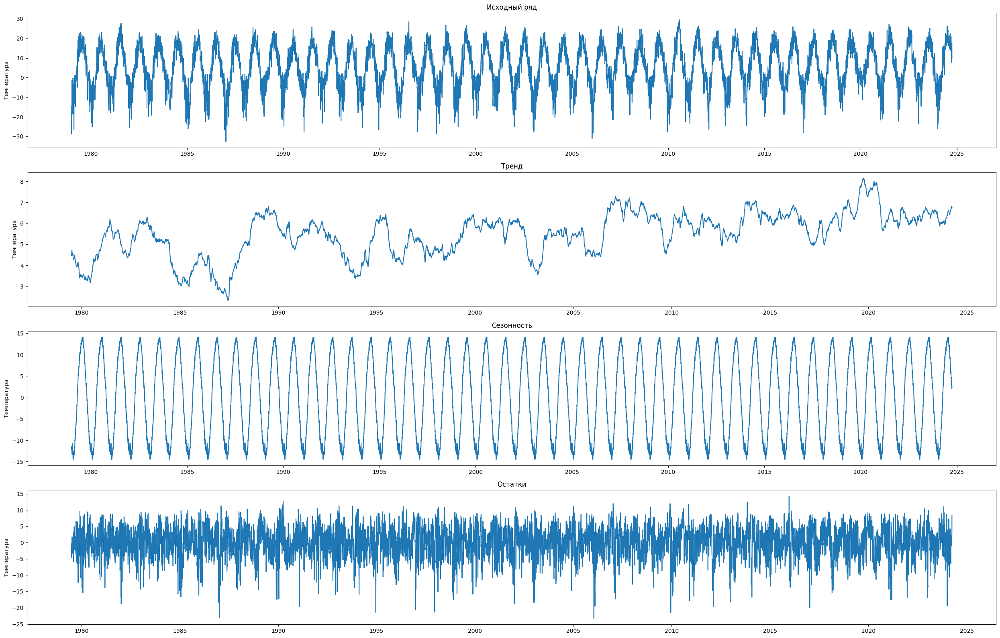

In [125]:
decomposition = sm.tsa.seasonal_decompose(df['temp_mean'], period=365)
fig, axes = plt.subplots(4, 1, figsize=(25, 16))
# Исходный ряд
axes[0].plot(decomposition.observed)
axes[0].set_ylabel('Температура')
axes[0].set_title(f'Исходный ряд')
# Тренд
axes[1].plot(decomposition.trend)
axes[1].set_ylabel('Температура')
axes[1].set_title(f'Тренд')
# Сезонность
axes[2].plot(decomposition.seasonal)
axes[2].set_ylabel('Температура')
axes[2].set_title(f'Сезонность')
# Остатки
axes[3].plot(decomposition.resid)
axes[3].set_ylabel('Температура')
axes[3].set_title(f'Остатки')
plt.tight_layout()
plt.show()

In [128]:
result = adfuller(df['temp_mean'])

print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

if result[1] < 0.05:
    print("Отвергаем нулевую гипотезу (временной ряд стационарен).")
else:
    print("Не удалось отвергнуть нулевую гипотезу (временной ряд не стационарен).")

ADF Statistic: -9.553243728984997
p-value: 2.538601673839019e-16
Critical Values: {'1%': -3.430742434146542, '5%': -2.8617134401892668, '10%': -2.5668623178055165}
Отвергаем нулевую гипотезу (временной ряд стационарен).


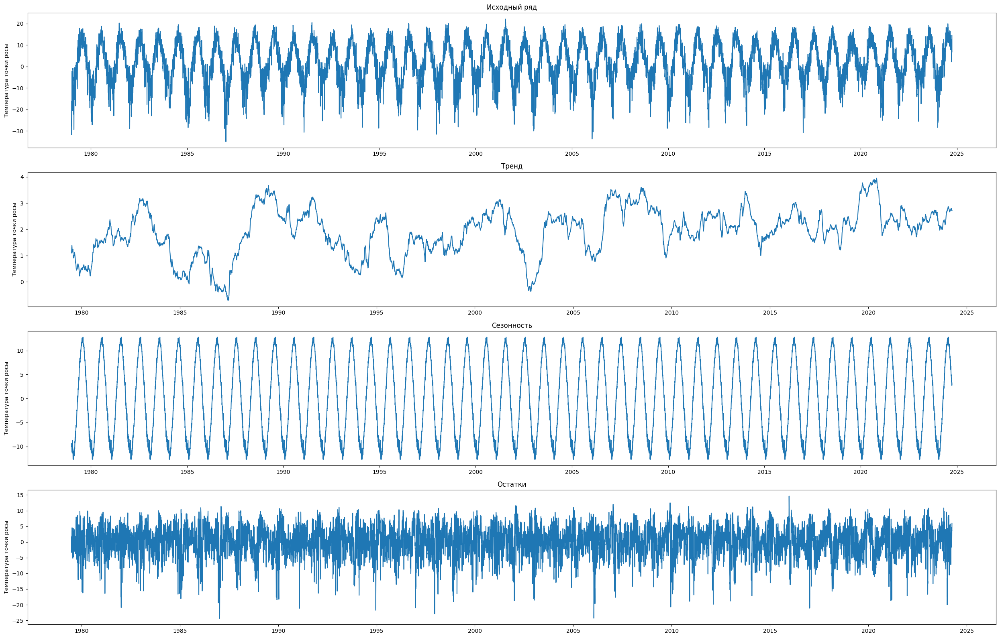

In [131]:
decomposition = sm.tsa.seasonal_decompose(df['dew_point_mean'], period=365)
fig, axes = plt.subplots(4, 1, figsize=(25, 16))
# Исходный ряд
axes[0].plot(decomposition.observed)
axes[0].set_ylabel('Температура точки росы')
axes[0].set_title(f'Исходный ряд')
# Тренд
axes[1].plot(decomposition.trend)
axes[1].set_ylabel('Температура точки росы')
axes[1].set_title(f'Тренд')
# Сезонность
axes[2].plot(decomposition.seasonal)
axes[2].set_ylabel('Температура точки росы')
axes[2].set_title(f'Сезонность')
# Остатки
axes[3].plot(decomposition.resid)
axes[3].set_ylabel('Температура точки росы')
axes[3].set_title(f'Остатки')
plt.tight_layout()
plt.show()

In [132]:
result = adfuller(df['dew_point_mean'])

print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

if result[1] < 0.05:
    print("Отвергаем нулевую гипотезу (временной ряд стационарен).")
else:
    print("Не удалось отвергнуть нулевую гипотезу (временной ряд не стационарен).")

ADF Statistic: -9.187364819773013
p-value: 2.169378674351411e-15
Critical Values: {'1%': -3.430742410597336, '5%': -2.861713429782148, '10%': -2.5668623122659526}
Отвергаем нулевую гипотезу (временной ряд стационарен).


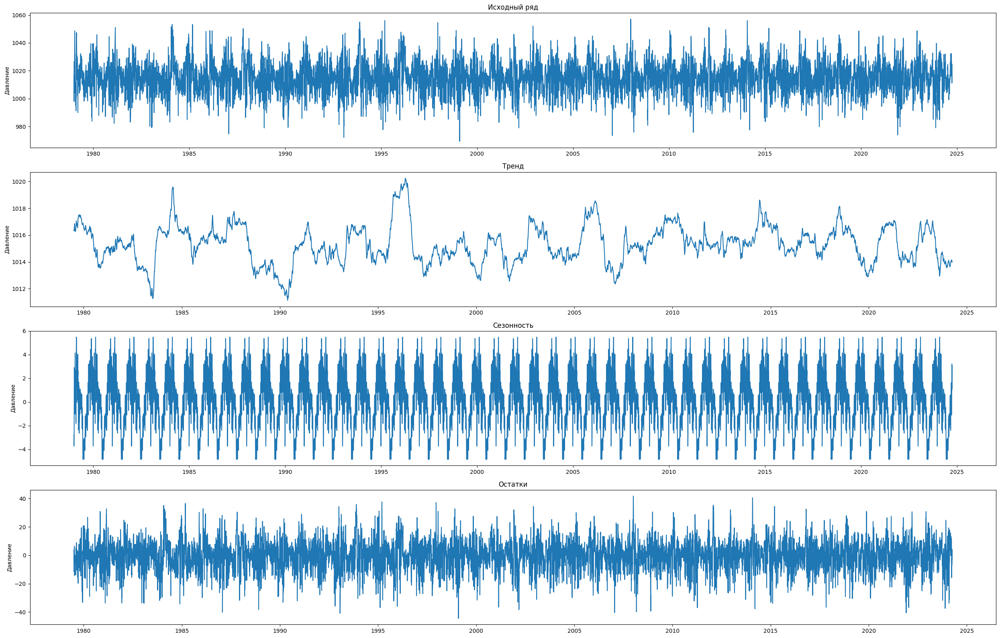

In [133]:
decomposition = sm.tsa.seasonal_decompose(df['pressure_mean'], period=365)
fig, axes = plt.subplots(4, 1, figsize=(25, 16))
# Исходный ряд
axes[0].plot(decomposition.observed)
axes[0].set_ylabel('Давление')
axes[0].set_title(f'Исходный ряд')
# Тренд
axes[1].plot(decomposition.trend)
axes[1].set_ylabel('Давление')
axes[1].set_title(f'Тренд')
# Сезонность
axes[2].plot(decomposition.seasonal)
axes[2].set_ylabel('Давление')
axes[2].set_title(f'Сезонность')
# Остатки
axes[3].plot(decomposition.resid)
axes[3].set_ylabel('Давление')
axes[3].set_title(f'Остатки')
plt.tight_layout()
plt.show()

In [134]:
result = adfuller(df['pressure_mean'])

print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

if result[1] < 0.05:
    print("Отвергаем нулевую гипотезу (временной ряд стационарен).")
else:
    print("Не удалось отвергнуть нулевую гипотезу (временной ряд не стационарен).")

ADF Statistic: -26.90702306148727
p-value: 0.0
Critical Values: {'1%': -3.4307417054330247, '5%': -2.861713118148297, '10%': -2.5668621463876033}
Отвергаем нулевую гипотезу (временной ряд стационарен).


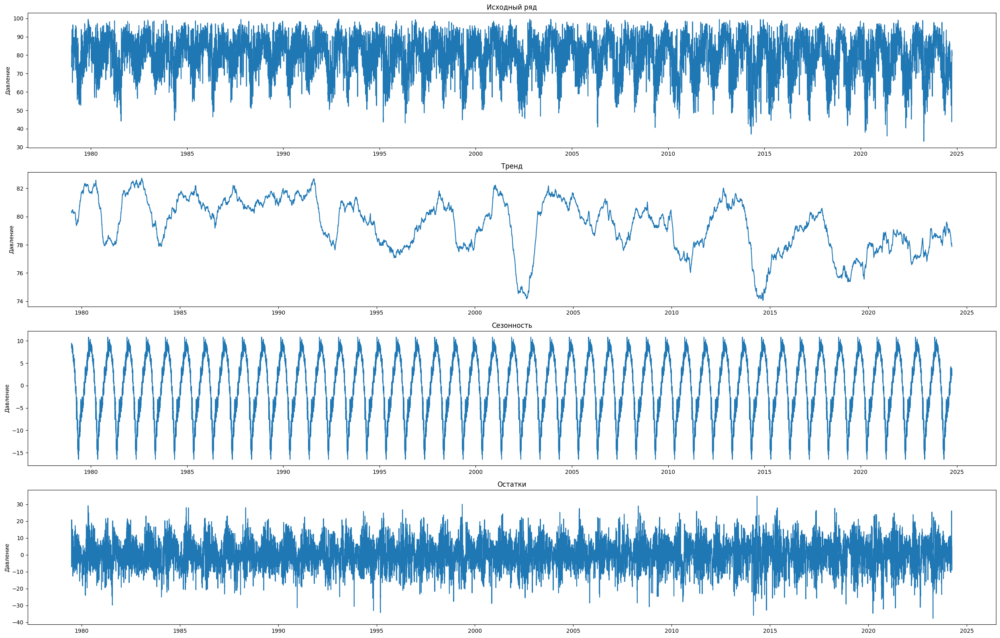

In [135]:
decomposition = sm.tsa.seasonal_decompose(df['humidity_mean'], period=365)
fig, axes = plt.subplots(4, 1, figsize=(25, 16))
# Исходный ряд
axes[0].plot(decomposition.observed)
axes[0].set_ylabel('Давление')
axes[0].set_title(f'Исходный ряд')
# Тренд
axes[1].plot(decomposition.trend)
axes[1].set_ylabel('Давление')
axes[1].set_title(f'Тренд')
# Сезонность
axes[2].plot(decomposition.seasonal)
axes[2].set_ylabel('Давление')
axes[2].set_title(f'Сезонность')
# Остатки
axes[3].plot(decomposition.resid)
axes[3].set_ylabel('Давление')
axes[3].set_title(f'Остатки')
plt.tight_layout()
plt.show()

In [136]:
result = adfuller(df['humidity_mean'])

print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

if result[1] < 0.05:
    print("Отвергаем нулевую гипотезу (временной ряд стационарен).")
else:
    print("Не удалось отвергнуть нулевую гипотезу (временной ряд не стационарен).")

ADF Statistic: -10.563943324916231
p-value: 7.601913372030428e-19
Critical Values: {'1%': -3.4307420576980996, '5%': -2.861713273825104, '10%': -2.566862229252193}
Отвергаем нулевую гипотезу (временной ряд стационарен).


Все основные временные ряды - стационарны по тесту Дикки-Фуллера. В целом, также прослеживаетс явная годичная сезонность и отсутствие явного положительного или отрицательного тренда.

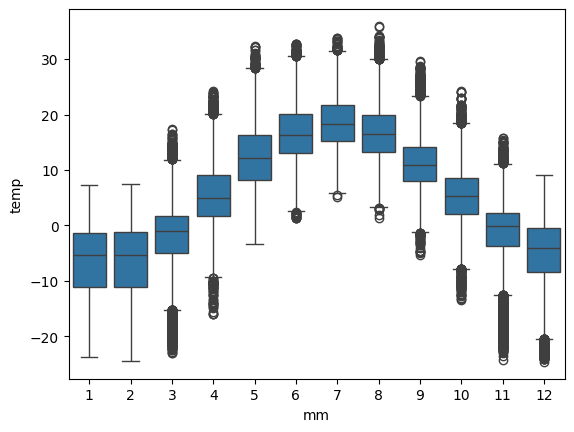

In [147]:
sns.boxplot(x='mm',y='temp',data=weather_data2)
plt.show()

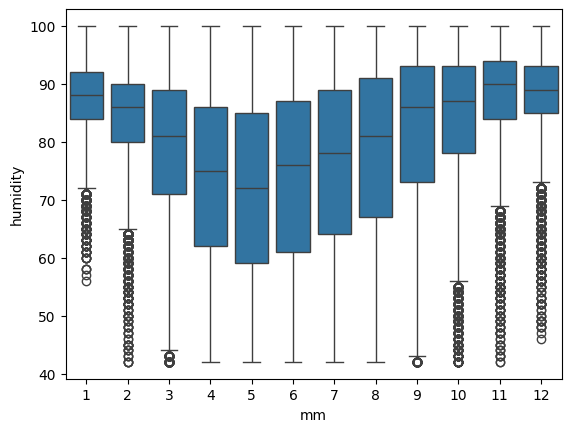

In [148]:
sns.boxplot(x='mm',y='humidity',data=weather_data2)
plt.show()

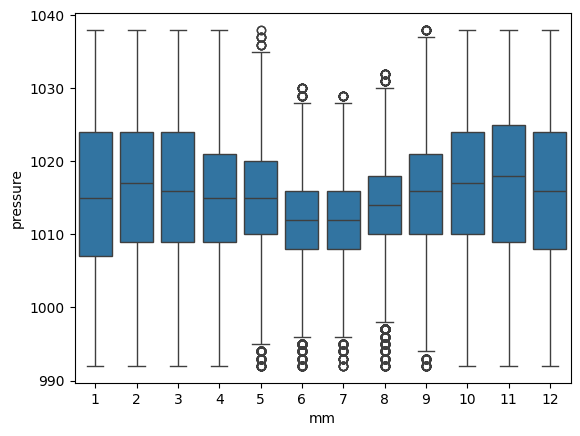

In [149]:
sns.boxplot(x='mm',y='pressure',data=weather_data2)
plt.show()

Если посмотреть на помесячные показатели - в рамках температуры наблюдается заметное и логичное увеличение в середине года летом, у влажности и давления же интересная динамика - у влажности растет межквантильное расстояние за счет появление меньших значений влажности летом (жара и сухость, Москва как никак не морской город (?)), у давления же идет уменьшение межквантильного расстояния летом. Летом атмосферное давление обычно уменьшается. Это связано с тем, что при повышении температуры воздуха он увеличивается в объёме, становится менее плотным, его масса уменьшается, в связи с чем понижается и атмосферное давление